In [1]:
using PyCall

In [14]:
using LinearAlgebra

In [18]:
using Plots

In [2]:
@pyimport ase.io as aseio

In [4]:
m = aseio.read("me-rigid-shortaug3-pbe0-ts-tsfix-mbd.xyz", index=":");

In [6]:
m[1].info

Dict{Any,Any} with 6 entries:
  "mbd_energy"    => -0.00879323
  "ts_fix_energy" => -0.0119936
  "pbe0_energy"   => -0.00462892
  "mp2_energy"    => -0.00998655
  "ts_energy"     => -0.0108144
  "ccsdt_energy"  => -0.0110829

In [17]:
r = [norm(mm.positions[1,:]-mm.positions[6,:]) for mm in m];


In [79]:
scatter(r, 1000/2*[mm.info["mbd_energy"] for mm in m], markersize=2, label="MBD", markeralpha=0.4, markerstrokewidth=0)
scatter!(r, 1000/2*[mm.info["ts_fix_energy"] for mm in m], markersize=2, label="TS(*)", markeralpha=0.4, markerstrokewidth=0)
plot!(legend=:bottomright)
scatter!(r, 1000/2*[mm.info["pbe0_energy"] for mm in m], markersize=2, label="PBE0", markeralpha=0.4, markerstrokewidth=0)
plot!(legend=:bottomright, yrange=[-25,25])

In [80]:
savefig("methane_dimer.pdf")

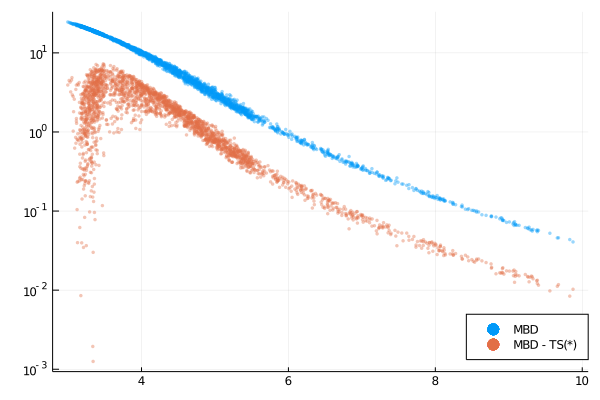

In [76]:
scatter(r, 1000/2*abs.([-mm.info["mbd_energy"] for mm in m]), markersize=2, yscale=:log10, label="MBD", markeralpha=0.4, markerstrokewidth=0)
scatter!(r, 1000/2*abs.([mm.info["ts_fix_energy"]-mm.info["mbd_energy"] for mm in m]), markersize=2, yscale=:log10, label="MBD - TS(*)", markeralpha=0.4, markerstrokewidth=0)
#scatter!(r, 1000/2*abs.([mm.info["pbe0_energy"] for mm in m]), markersize=2, label="PBE0", markeralpha=0.4, markerstrokewidth=0, yscale=:log10,)
plot!(legend=:bottomright)

In [77]:
savefig("methane_dimer_log.pdf")

In [63]:
scatter(r, 1000/2*[mm.info["mbd_energy"] for mm in m], markersize=2, label="mbd", markeralpha=0.4, markerstrokewidth=0)
scatter!(r, 1000/2*[mm.info["ts_fix_energy"] for mm in m], markersize=2, label="ts_fix", markeralpha=0.4, markerstrokewidth=0)
scatter!(r, inset = (1, bbox(0.3, 0.3, 0.65, 0.4, :bottom)), subplot = 2, 1000/2*abs.([-mm.info["mbd_energy"] for mm in m]), markersize=2, yscale=:log10, label="mbd", markeralpha=0.4, markerstrokewidth=0)
scatter!(r, subplot = 2, 1000/2*abs.([mm.info["ts_fix_energy"]-mm.info["mbd_energy"] for mm in m]), markersize=2, yscale=:log10, label="mbd-ts_fix", markeralpha=0.4, markerstrokewidth=0)


plot!(legend=:topleft, subplot=1, xlabel="distance / Å", ylabel=" interaction energy / meV")
plot!(legend=:topright, subplot=2)

In [64]:
savefig("mbdtsfix.pdf")

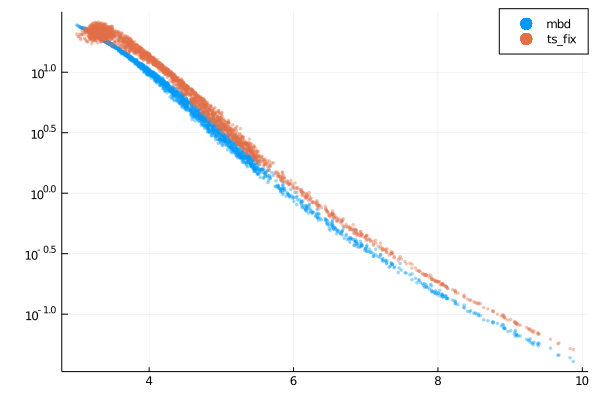

In [78]:
scatter(r, -1000/2*[mm.info["mbd_energy"] for mm in m], markersize=2, yscale=:log10, label="mbd", markeralpha=0.4, markerstrokewidth=0)
scatter!(r, -1000/2*[mm.info["ts_fix_energy"] for mm in m], markersize=2,  yscale=:log10, label="ts_fix", markeralpha=0.4, markerstrokewidth=0)
#scatter!(r, -[mm.info["ts_energy"] for mm in m], markersize=1,  yscale=:log10)
